In [1]:
#======================================================================================
import random as rnd
import numpy as np
import matplotlib.pyplot as plt
#======================================================================================
import tensorflow as tf
import tensorflow_datasets as tfds
#======================================================================================
from keras import utils, callbacks
from keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Conv2D, BatchNormalization, MaxPool2D, Flatten, Dense, Dropout
from keras.preprocessing.image import ImageDataGenerator, NumpyArrayIterator
#======================================================================================

#Loading dataset

In [2]:
# Loading dataset
lab_dataset, info = tfds.load('imagenette/160px-v2', with_info = True, as_supervised = True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/2 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/9469 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/imagenette/160px-v2/1.0.0.incomplete1SHAP3/imagenette-train.tfrecord*...: …

Generating validation examples...:   0%|          | 0/3925 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/imagenette/160px-v2/1.0.0.incomplete1SHAP3/imagenette-validation.tfrecord*…

Dataset imagenette downloaded and prepared to /root/tensorflow_datasets/imagenette/160px-v2/1.0.0. Subsequent calls will reuse this data.


In [3]:
# Separating it in train and test parts
ds_train_part, ds_test_part = lab_dataset['train'], lab_dataset['validation']

In [4]:
# Getting info about train and test datasets sizes
train_ds_size = info.splits['train'].num_examples
test_ds_size = info.splits['validation'].num_examples

# Displaying datasets size and shape information
print(f"Datasets size:\n-- Train ==> {train_ds_size}\n-- Test ==> {test_ds_size}")

Datasets size:
-- Train ==> 9469
-- Test ==> 3925


In [5]:
# Loading classes
class_number, image_labels = info.features['label'].num_classes, info.features['label'].int2str
label_names = [image_labels(id) for id in range(class_number)]

# Creating array with classes actual names
actual_names = ['Fish',           # Class #0
                'Dog',            # Class #1
                'Casette player', # Class #2
                'Chainsaw',       # Class #3
                'Church',         # Class #4
                'French horn',    # Class #5
                'Garbage truck',  # Class #6
                'Gas pump',       # Class #7
                'Golf ball',      # Class #8
                'Skydiver']       # Class #9

# Displaying these classes
print(f"Dataset has {class_number} classes in total:")
for class_id, label in enumerate(label_names):
    print(f'Class #{class_id} ==> {label}({actual_names[class_id]})')

Dataset has 10 classes in total:
Class #0 ==> n01440764(Fish)
Class #1 ==> n02102040(Dog)
Class #2 ==> n02979186(Casette player)
Class #3 ==> n03000684(Chainsaw)
Class #4 ==> n03028079(Church)
Class #5 ==> n03394916(French horn)
Class #6 ==> n03417042(Garbage truck)
Class #7 ==> n03425413(Gas pump)
Class #8 ==> n03445777(Golf ball)
Class #9 ==> n03888257(Skydiver)


In [6]:
# Creating func that shows images from splitted dataset
def show_images(dtst, size, act_name = actual_names, img_labels = image_labels):
    plt.figure(figsize = (15, 15))
    for i, (image, label) in enumerate(dtst.take(size)):
        plt.subplot(5, 5, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(image)
        plt.xlabel(f"Class: #{label.numpy()}, {img_labels(label.numpy())}\n({act_name[label.numpy()]})")
    plt.show

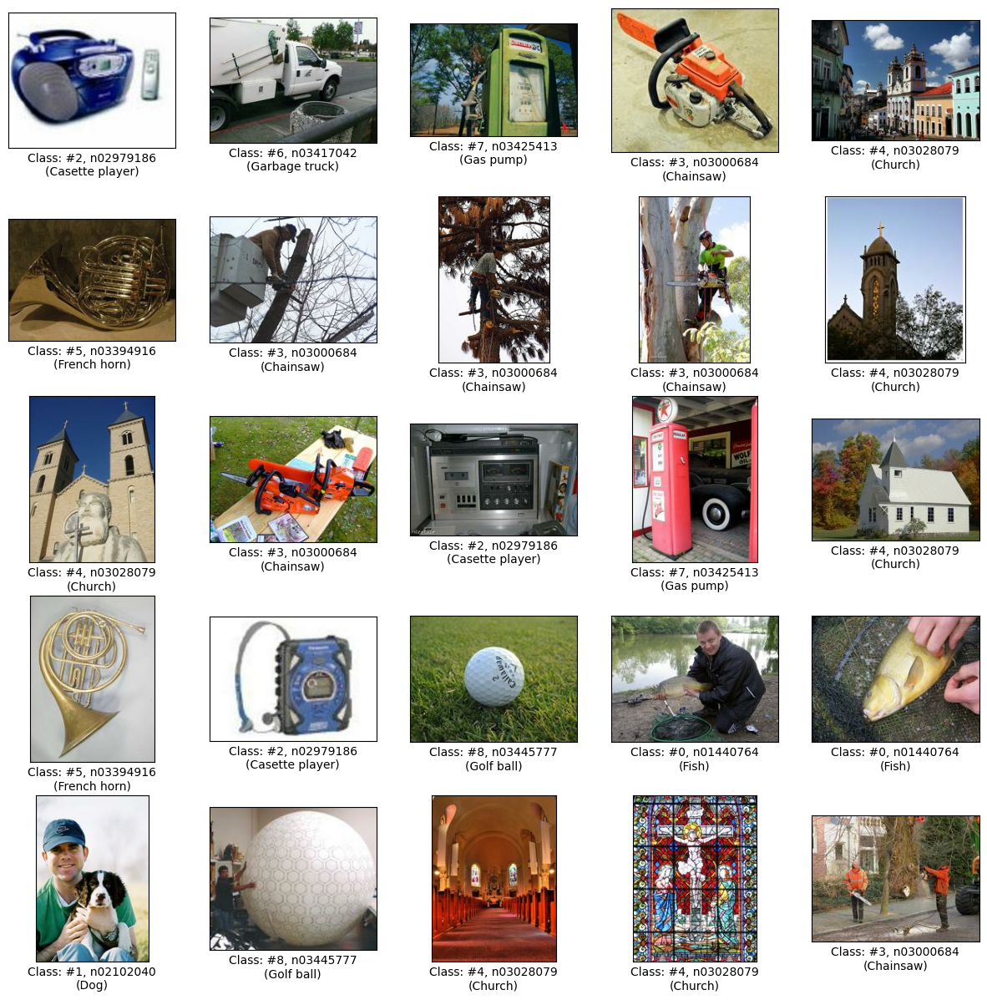

In [15]:
# Viewing images from train dataset
show_images(ds_train_part, 25)

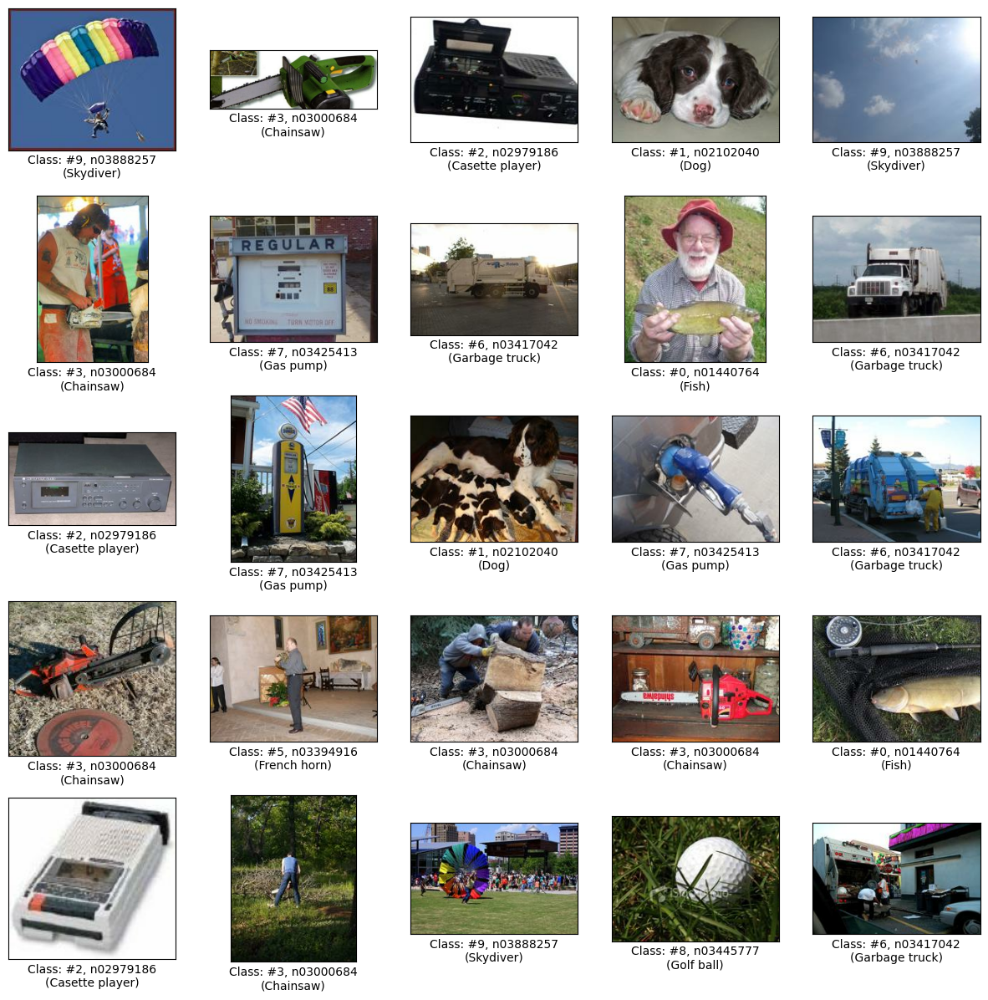

In [16]:
# Viewing images from test dataset
show_images(ds_test_part, 25)

#Preparing training/test data for model

In [17]:
# Preprocess image
def preprocess_image(img, lbl):
    img = tf.image.per_image_standardization(img)
    img = tf.image.resize(img, (227, 227))
    img = tf.clip_by_value(img, 0.0, 1.0)
    return img, lbl

# Adjusting datasets
ds_train_part_proc = ds_train_part.map(preprocess_image)
ds_test_part_proc = ds_test_part.map(preprocess_image)

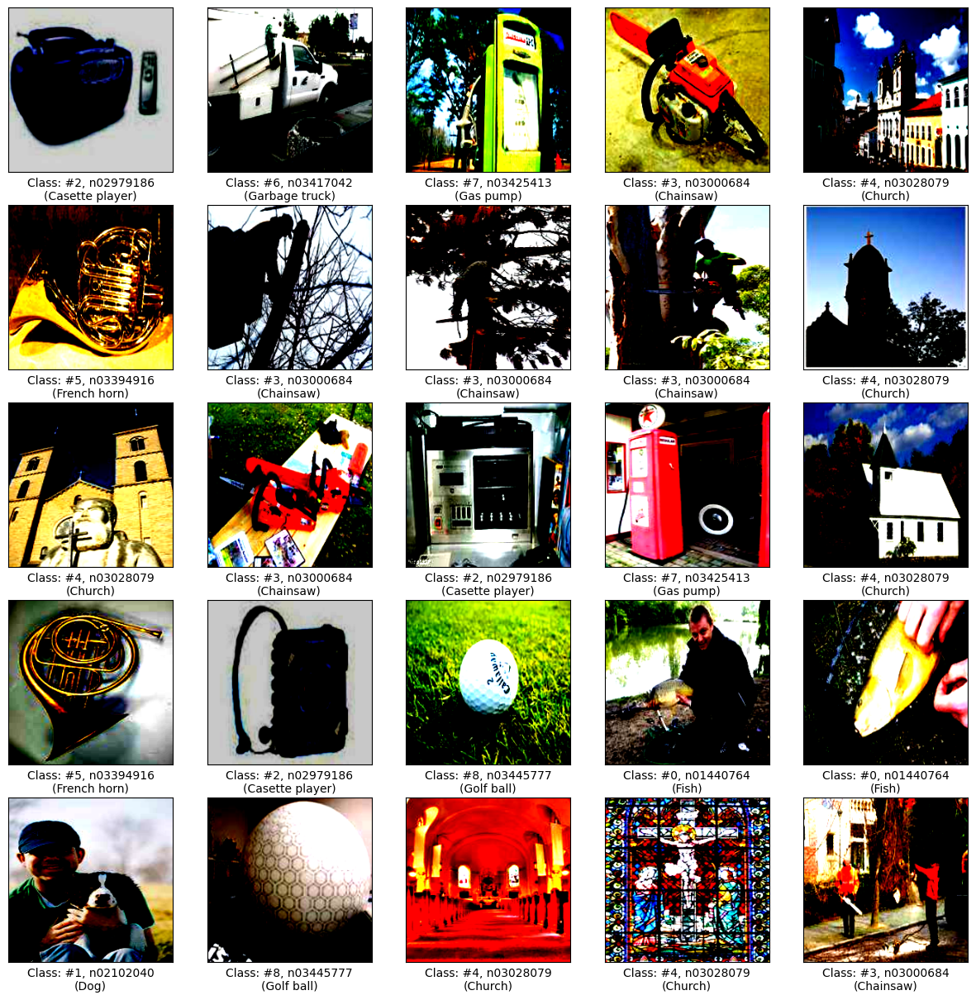

In [18]:
# Viewing preprocessed images from train dataset
show_images(ds_train_part_proc, 25)

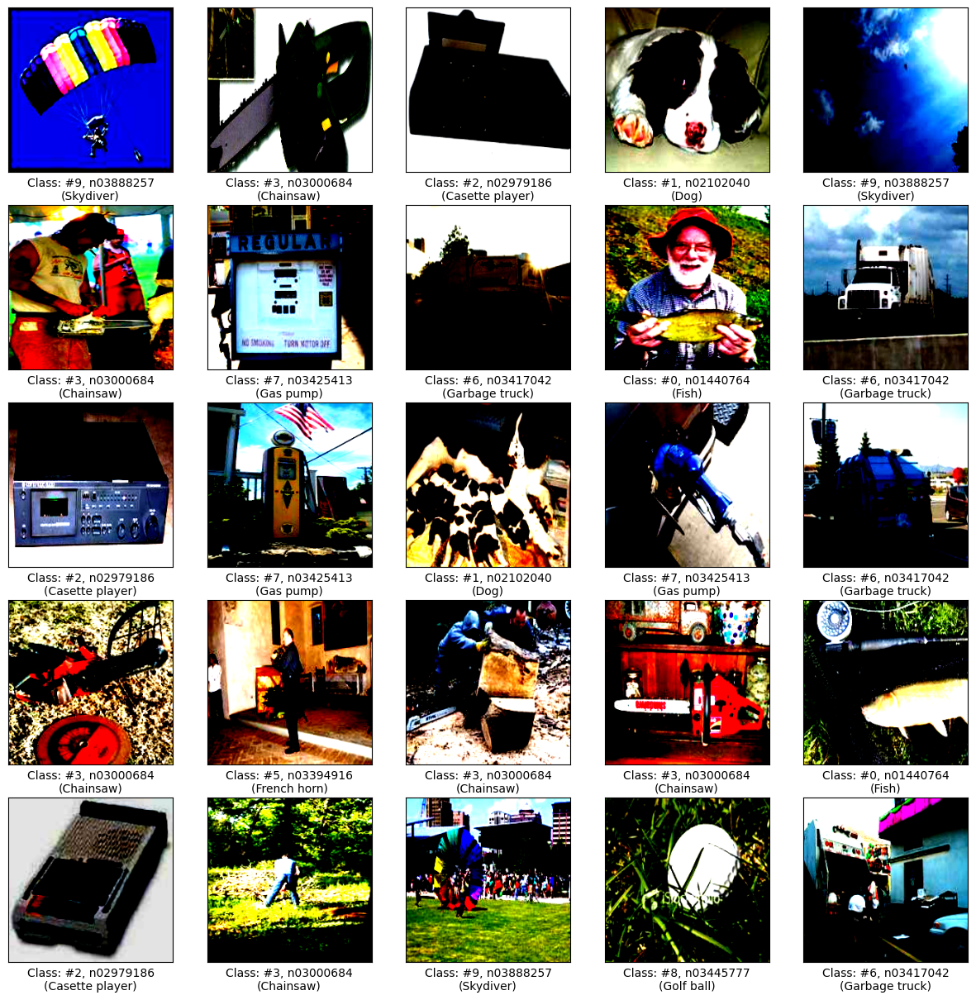

In [19]:
# Viewing preprocessed images from test dataset
show_images(ds_test_part_proc, 25)

# Creating AlexNet NN model

In [20]:
# Creating AlexNet NN model
def Create_AlexNet_NN_Model():
    model = Sequential([
        # Layer #1
        Conv2D(filters = 96, input_shape = (227, 227, 3), kernel_size = (11, 11), strides = (4, 4), padding = 'valid', activation = 'relu'),
        BatchNormalization(),
        MaxPool2D(pool_size = (3, 3), strides = (2, 2)),

        # Layer #2
        Conv2D(filters = 256, kernel_size = (5, 5), strides = (1, 1), padding = 'same', activation = 'relu'),
        BatchNormalization(),
        MaxPool2D(pool_size = (3, 3), strides = (2, 2)),

        # Layer #3
        Conv2D(filters = 384, kernel_size = (3, 3), strides = (1, 1), padding = 'same', activation = 'relu'),
        BatchNormalization(),

        # Layer #4
        Conv2D(filters = 384, kernel_size = (3, 3), strides = (1, 1), padding = 'same', activation = 'relu'),
        BatchNormalization(),

        # Layer #5
        Conv2D(filters = 256, kernel_size = (3, 3), strides = (1, 1), padding = 'same', activation = 'relu'),
        BatchNormalization(),
        MaxPool2D(pool_size = (3, 3), strides = (2, 2)),
        Flatten(),

        # Layer #6
        Dense(4096, activation = 'relu'),
        Dropout(0.5),

        # Layer #7
        Dense(4096, activation = 'relu'),
        Dropout(0.5),

        # Layer #8
        Dense(10, activation = 'softmax')
    ], name = 'AlexNet_neural_network')
    return model

In [21]:
# Creating new AlexNet NN model and compiling it
alex_net_model = Create_AlexNet_NN_Model()
alex_net_model.compile(optimizer = 'adam',
              loss = 'sparse_categorical_crossentropy',
              metrics = ['accuracy'])
alex_net_model.summary()

Model: "AlexNet_neural_network"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_5 (Conv2D)           (None, 55, 55, 96)        34944     
                                                                 
 batch_normalization_5 (Bat  (None, 55, 55, 96)        384       
 chNormalization)                                                
                                                                 
 max_pooling2d_3 (MaxPoolin  (None, 27, 27, 96)        0         
 g2D)                                                            
                                                                 
 conv2d_6 (Conv2D)           (None, 27, 27, 256)       614656    
                                                                 
 batch_normalization_6 (Bat  (None, 27, 27, 256)       1024      
 chNormalization)                                                
                                            

#Model training

In [22]:
# training model
history = alex_net_model.fit(ds_train_part_proc.batch(64), epochs = 40, validation_data = ds_test_part_proc.batch(64))

Epoch 1/40
148/148 [==============================] - 18s 97ms/step - loss: 5.6723 - accuracy: 0.2360 - val_loss: 2.2192 - val_accuracy: 0.1908
Epoch 2/40
148/148 [==============================] - 15s 99ms/step - loss: 1.9579 - accuracy: 0.3483 - val_loss: 2.0445 - val_accuracy: 0.2752
Epoch 3/40
148/148 [==============================] - 14s 97ms/step - loss: 1.8026 - accuracy: 0.4086 - val_loss: 2.0352 - val_accuracy: 0.3192
Epoch 4/40
148/148 [==============================] - 15s 99ms/step - loss: 1.7064 - accuracy: 0.4439 - val_loss: 1.6118 - val_accuracy: 0.4943
Epoch 5/40
148/148 [==============================] - 15s 101ms/step - loss: 1.6050 - accuracy: 0.4820 - val_loss: 1.6064 - val_accuracy: 0.4617
Epoch 6/40
148/148 [==============================] - 15s 102ms/step - loss: 1.5191 - accuracy: 0.5101 - val_loss: 1.5840 - val_accuracy: 0.4981
Epoch 7/40
148/148 [==============================] - 15s 101ms/step - loss: 1.4510 - accuracy: 0.5337 - val_loss: 1.5051 - val_accura

# Training and Test(Validation) Loss and Accuracy

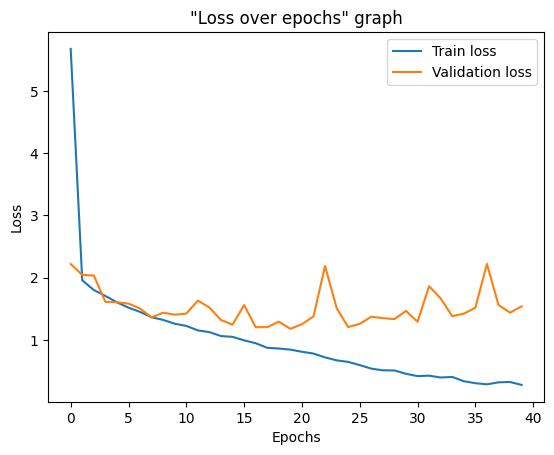

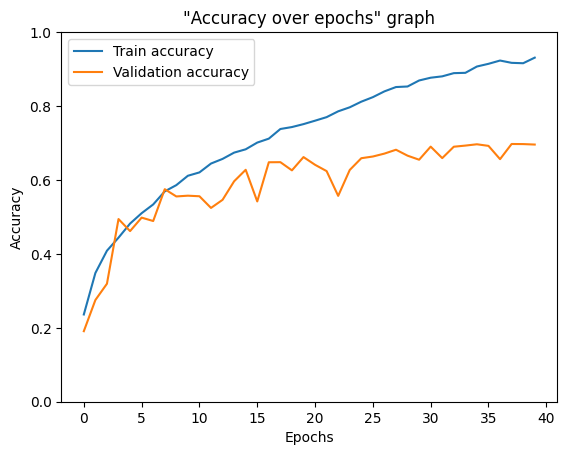

In [25]:
# Plotting "Loss over epochs" graph
plt.plot(history.history['loss'], label = 'Train loss')
plt.plot(history.history['val_loss'], label = 'Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('"Loss over epochs" graph')
plt.legend()
plt.show()

# Plotting "Accuracy over epoch" graph
plt.plot(history.history['accuracy'], label = 'Train accuracy')
plt.plot(history.history['val_accuracy'], label = 'Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.title('"Accuracy over epochs" graph')
plt.ylim([0, 1])
plt.legend()
plt.show()

In [27]:
# Getting info about  final loss and accuracy for both train and test
train_loss, train_accuracy = alex_net_model.evaluate(ds_train_part_proc.batch(64))
test_loss, test_accuracy = alex_net_model.evaluate(ds_test_part_proc.batch(64))

print(f'Train loss: {train_loss}')
print(f'Train accuracy: {train_accuracy}')

print(f'Test loss: {test_loss}')
print(f'Test accuracy: {test_accuracy}')

62/62 [==============================] - 2s 37ms/step - loss: 1.5407 - accuracy: 0.6958
Train loss: 0.2177627831697464
Train accuracy: 0.9484633803367615
Test loss: 1.5407404899597168
Test accuracy: 0.6957961916923523


In [28]:
# Saving trained model
alex_net_model.save('alexnet_trained_model_imagenette_v2.keras')

# Viewing predictions on test dataset images

In [41]:
# Viewing prediction of first image from test dataset
#test_predictions = model.predict(ds_test_part)

def image_prediction_grid(dtst, size, act_name = actual_names, img_labels = image_labels):
    plt.figure(figsize = (21, 21))
    for i, (image, label) in enumerate(dtst.take(size)):
        plt.subplot(5, 5, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(image)
        real_label = label.numpy()
        preproc_img = preprocess_image(image, label)
        image_for_pred = preproc_img[0]
        image_for_pred = tf.expand_dims(image_for_pred, axis = 0)
        prediction = alex_net_model.predict(image_for_pred)
        pred_label = np.argmax(prediction)

        plt.xlabel(f"Real: #{real_label}, {img_labels(real_label)} ({act_name[real_label]})\n" +
                   f"Predicted: #{pred_label}, {img_labels(pred_label)} ({act_name[pred_label]})",
                   color = 'green' if pred_label == real_label else 'red')
    plt.show

1/1 [==============================] - 0s 20ms/step


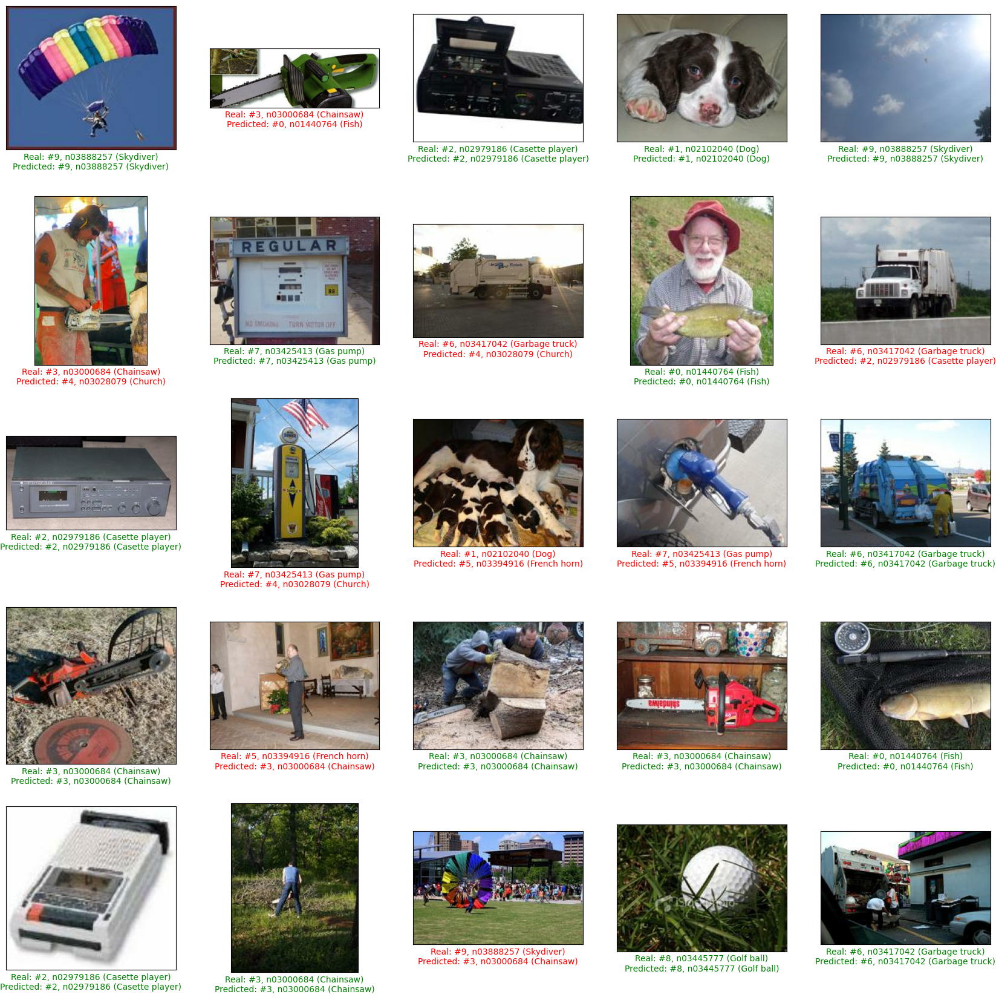

In [42]:
image_prediction_grid(ds_test_part, 25)

In [43]:
# unused plot func elements
'''
    plt.figure(figsize = (15, 15))
    for i in range(size):
        img_id = np.random.randint(len(dtst))
        image, label = dtst[img_id]
        label_index = np.argmax(label)
        plt.subplot(5, 5, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.grid(False)
        plt.imshow(image[0])
        plt.xlabel(f"Class: #{label_index}, {image_labels(label_index)}\n({act_name[label_index]})")
'''
'''
    plt.figure(figsize = (20, 20))
    for i in range(25):
        img_id = np.random.randint(len(dtst))
        image, image_label = dtst[img_id]
        prediction = (model.predict(dtst))[img_id]
        predict_label = np.argmax(prediction)
        real_label = np.argmax(image_label)
        plt.subplot(5, 5, i + 1)
        plt.grid(False)
        plt.xticks([])
        plt.yticks([])
        plt.imshow(image[0])
        plt.xlabel(f"Real: class #{real_label}, {img_labels(real_label)} ({act_name[real_label]})\n" +
                   f"Predicted: class #{predict_label}, {img_labels(predict_label)} ({act_name[predict_label]})",
                   color = 'green' if predict_label == real_label else 'red')
'''

# unused dataset and image preprocess elements
'''
# Preparing training and test data for model
# (from train and test parts of imagenette dataset)
x_train = list(map(lambda img: img[0], ds_train_part))
y_train = list(map(lambda img: img[1], ds_train_part))

x_test = list(map(lambda img: img[0], ds_test_part))
y_test = list(map(lambda img: img[1], ds_test_part))

# Switching y train/test values to cathegorical
y_train = utils.to_categorical(y_train, image_size)
y_test = utils.to_categorical(y_test, image_size)
'''
'''
# Creating data generators for train and test datasets
# (we'll use them for image px scaling)
train_data_generator = ImageDataGenerator(rescale = 1./255)
test_data_generator = ImageDataGenerator(rescale = 1./255)

ds_train_part = NumpyArrayIterator(x = np.array(x_train), y = np.array(y_train),
                                   image_data_generator = train_data_generator,
                                   batch_size = 64)
ds_test_part = NumpyArrayIterator(x = np.array(x_test), y = np.array(y_test),
                                   image_data_generator = test_data_generator,
                                   batch_size = 64)
'''

"\n# Creating data generators for train and test datasets\n# (we'll use them for image px scaling)\ntrain_data_generator = ImageDataGenerator(rescale = 1./255)\ntest_data_generator = ImageDataGenerator(rescale = 1./255)\n\nds_train_part = NumpyArrayIterator(x = np.array(x_train), y = np.array(y_train),\n                                   image_data_generator = train_data_generator,\n                                   batch_size = 64)\nds_test_part = NumpyArrayIterator(x = np.array(x_test), y = np.array(y_test),\n                                   image_data_generator = test_data_generator,\n                                   batch_size = 64)\n"